<a href="https://colab.research.google.com/github/Stephen-sanchez1/Diabetes_dataset/blob/main/Stephen_Sanchez_Diabetes_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 1. Install Packages

In [ ]:
!pip install seaborn
!pip install missingno
!pip install xgboost
!pip install catboost
!pip install regex
!pip install sklearn
!pip install pandas
!pip install numpy
!pip install imblearn
!pip install lightgbm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 9.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


### 2. Import Packages

In [ ]:
import pandas as pd
import plotly.express as px
import missingno as msno
import numpy as np

### 3. Load Dataset

In [ ]:
#df =  pd.read_csv("/Users/stephen/Downloads/diabetes+130-us+hospitals+for+years+1999-2008/diabetic_data.csv")
#df

df =pd.read_csv("/content/diabetic_data.csv")
df

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


### 4. Clean Data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [ ]:
# Replace missing values of '?' into NaN
df.replace("?", np.nan, inplace=True)
df

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),NaN,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),NaN,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),NaN,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),NaN,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [ ]:
def missing (df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(df)

,Missing_Number,Missing_Percent
weight,98569,0.968585
max_glu_serum,96420,0.947468
A1Cresult,84748,0.832773
medical_specialty,49949,0.490822
payer_code,40256,0.395574
race,2273,0.022336
diag_3,1423,0.013983
diag_2,358,0.003518
diag_1,21,0.000206
encounter_id,0,0.000000


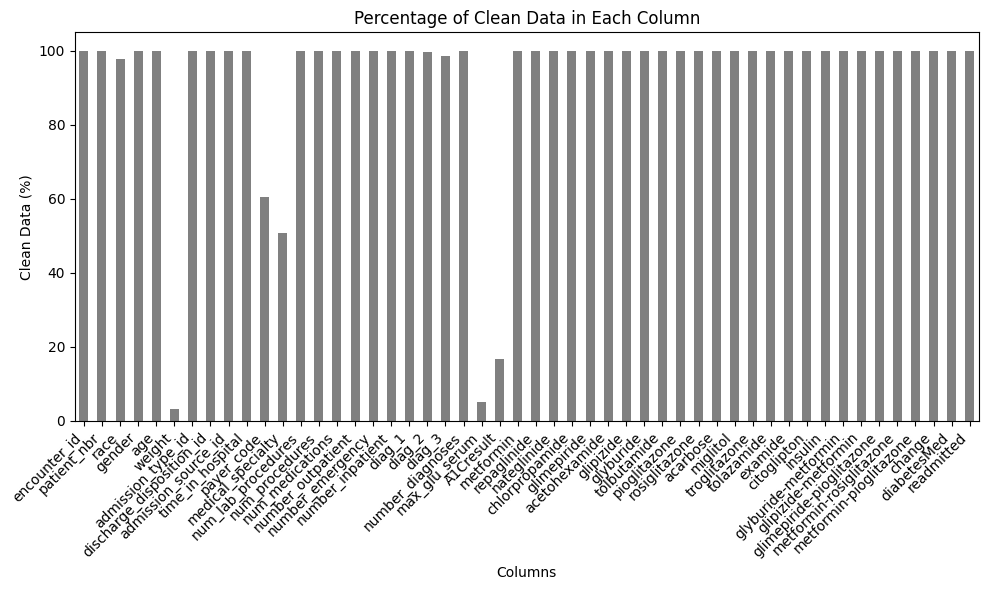

In [ ]:
import matplotlib.pyplot as plt

# Percentage of non-null values for each column
clean_data_percentage = (df.count() / len(df)) * 100

# Bar plot:
plt.figure(figsize=(10, 6))
clean_data_percentage.plot(kind='bar', color='gray')
plt.title('Percentage of Clean Data in Each Column')
plt.xlabel('Columns')
plt.ylabel('Clean Data (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


<Axes: >

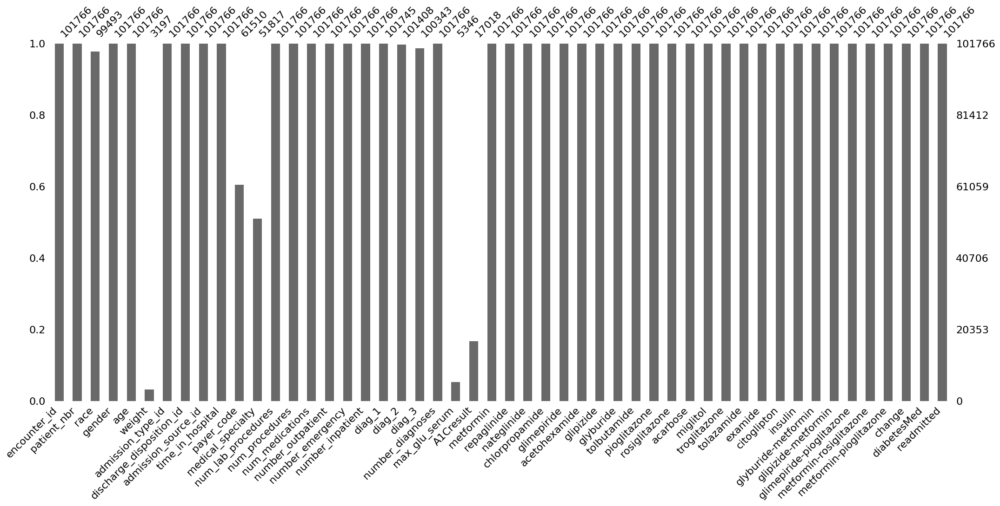

In [ ]:
msno.bar(df)

In [ ]:
df.drop(columns=['weight'], inplace=True)
df.head()

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),6,25,1,1,NaN,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),1,1,7,3,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),1,1,7,2,NaN,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),1,1,7,2,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),1,1,7,1,NaN,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
df['A1Cresult'].fillna('not measured', inplace=True)
df['max_glu_serum'].fillna('not measured', inplace=True)

In [ ]:
df = df.fillna('N/A')

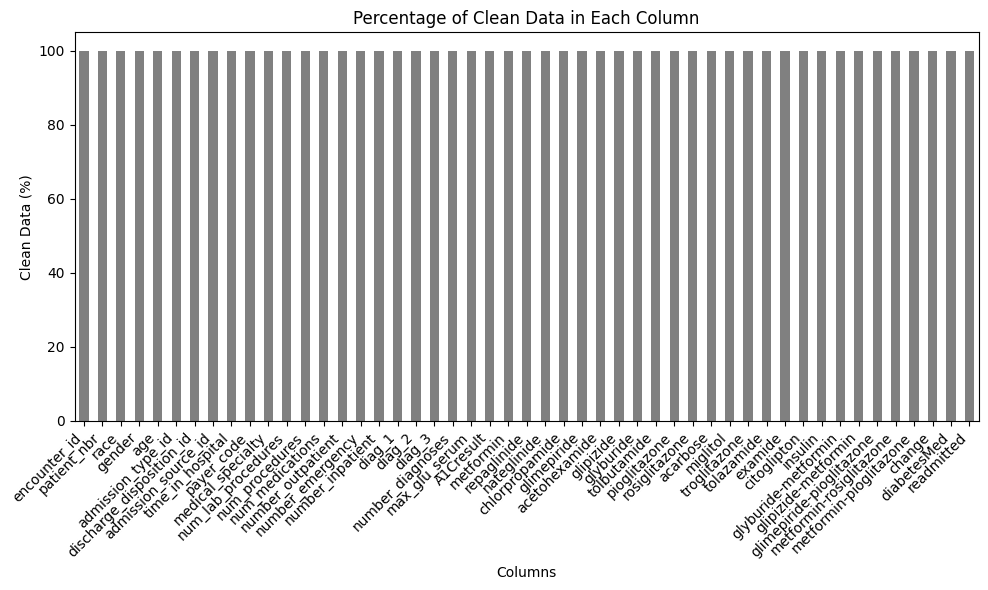

In [ ]:
import matplotlib.pyplot as plt

# Percentage of non-null values for each column
clean_data_percentage = (df.count() / len(df)) * 100

# Bar plot:
plt.figure(figsize=(10, 6))
clean_data_percentage.plot(kind='bar', color='gray')
plt.title('Percentage of Clean Data in Each Column')
plt.xlabel('Columns')
plt.ylabel('Clean Data (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 5. Numerical/Categorical -  Univariate Analysis



In [ ]:
df.head()


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),6,25,1,1,N/A,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),1,1,7,3,N/A,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),1,1,7,2,N/A,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),1,1,7,2,N/A,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),1,1,7,1,N/A,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
# Categorical/ Numerical
categorical = ['race', 'gender', 'age', 'admission_type_id', 'insulin', 'change', 'diabetesMed', 'readmitted']

numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']


#### Numerical

In [ ]:
df[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [ ]:
df[numerical].skew()

time_in_hospital       1.133999
num_lab_procedures    -0.236544
num_procedures         1.316415
num_medications        1.326672
number_outpatient      8.832959
number_emergency      22.855582
number_inpatient       3.614139
number_diagnoses      -0.876746
dtype: float64

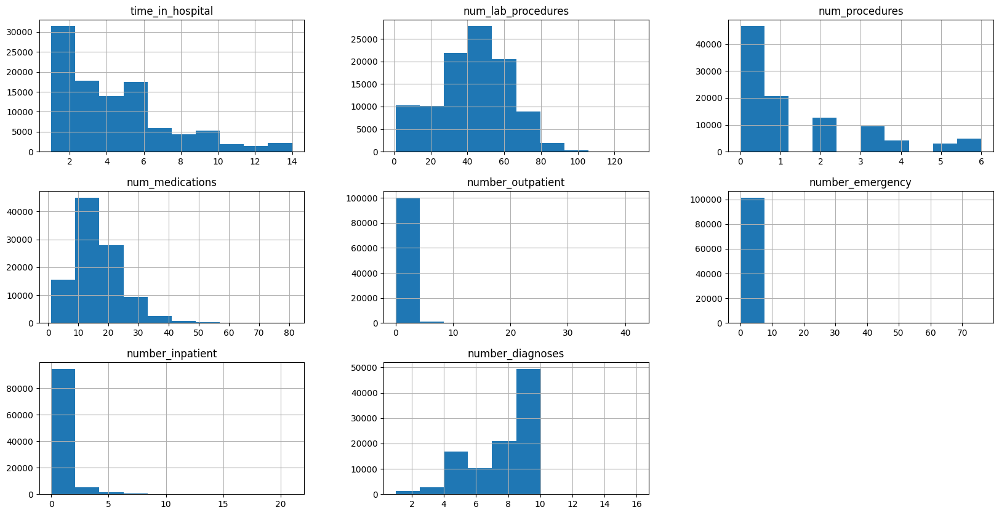

In [ ]:
df[numerical].hist(figsize=(20,10));

#### Categorical

In [ ]:
# Gender
print (f'{round(df["gender"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(df, x="gender", title='gender', width=500, height=500)
fig.show()

gender
Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: proportion, dtype: float64


In [ ]:
# Age
print (f'{round(df["age"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(df, x="age", title='age', width=500, height=500)
fig.show()

age
[70-80)     25.62
[60-70)     22.09
[50-60)     16.96
[80-90)     16.90
[40-50)      9.52
[30-40)      3.71
[90-100)     2.74
[20-30)      1.63
[10-20)      0.68
[0-10)       0.16
Name: proportion, dtype: float64


In [ ]:
# Race
print (f'{round(df["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(df, x="race", title='Race', width=500, height=500)
fig.show()

race
Caucasian          74.78
AfricanAmerican    18.88
N/A                 2.23
Hispanic            2.00
Other               1.48
Asian               0.63
Name: proportion, dtype: float64


In [ ]:
# Readmitted
print (f'{round(df["readmitted"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(df, x="readmitted", title='Readmitted', width=500, height=500)
fig.show()

readmitted
NO     53.91
>30    34.93
<30    11.16
Name: proportion, dtype: float64


In [ ]:
# Admission type id
print (f'{round(df["admission_type_id"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(df, x="admission_type_id", title='Admissions type', width=1000, height=1000)
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

admission_type_id
1    53.05
3    18.54
2    18.16
6     5.20
5     4.70
8     0.31
7     0.02
4     0.01
Name: proportion, dtype: float64


In [ ]:
# Change
change_percentage = round(df["change"].value_counts(normalize=True) * 100, 2)
print(f'Change Distribution:\n{change_percentage}')
change_histogram = px.histogram(df, x="change", title='Change Distribution', width=500, height=500)
change_histogram.show()

Change Distribution:
change
No    53.8
Ch    46.2
Name: proportion, dtype: float64


In [ ]:
# DiabetesMed
diabetesMed_percentage = round(df["diabetesMed"].value_counts(normalize=True) * 100, 2)
print(f'Diabetes Medication Distribution:\n{diabetesMed_percentage}')
diabetesMed_histogram = px.histogram(df, x="diabetesMed", title='Diabetes Medication Distribution', width=500, height=500)
diabetesMed_histogram.show()

Diabetes Medication Distribution:
diabetesMed
Yes    77.0
No     23.0
Name: proportion, dtype: float64


In [ ]:
# Insulin
insulin_percentage = round(df["insulin"].value_counts(normalize=True) * 100, 2)
print(f'Insulin Distribution:\n{insulin_percentage}')
insulin_histogram = px.histogram(df, x="insulin", title='Insulin Distribution', width=500, height=500)
insulin_histogram.show()


Insulin Distribution:
insulin
No        46.56
Steady    30.31
Down      12.01
Up        11.12
Name: proportion, dtype: float64


### 6. Bivariate Analysis

In [ ]:
## 0 = not readmitted or readmitted after 30 days
## 1 = readmitted within 30 days
readmitted = {'NO':0, '>30':0, '<30':1}
df['readmitted'] = df['readmitted'].map(readmitted)



#### Gender and Readmitted

In [ ]:
df.gender.unique()

array(['Female', 'Male', 'Unknown/Invalid'], dtype=object)

In [ ]:
print (f'A patient who is "Female" has a probability of {round(df[df["gender"]=="Female"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A patient who is "Male" has a probability of {round(df[df["gender"]=="Male"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A patient from the "Unknown/Invalid" category of race has a probability of {round(df[df["gender"]=="Unknown/Invalid"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

A patient who is "Female" has a probability of 11.25 % to be readmitted within 30 days of discharge.

A patient who is "Male" has a probability of 11.06 % to be readmitted within 30 days of discharge.

A patient from the "Unknown/Invalid" category of race has a probability of 0.0 % to be readmitted within 30 days of discharge.


In [ ]:
# # Histogram of gender with readmission within 30 days color-coded
fig = px.histogram(df, x="gender", color="readmitted",width=600, height=600)
fig.show()

#### Race and Readmitted

In [ ]:
df.race.unique()

array(['Caucasian', 'AfricanAmerican', 'N/A', 'Other', 'Asian',
       'Hispanic'], dtype=object)

In [ ]:
print (f'A person who is "Caucasian" has a probability of {round(df[df["race"]=="Caucasian"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A person who is "AfricanAmerican" has a probability of {round(df[df["race"]=="AfricanAmerican"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A person from the "Other" category of race has a probability of {round(df[df["race"]=="Other"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A person who is "Asian" has a probability of {round(df[df["race"]=="Asian"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')

print()

print (f'A person who is "Hispanic" has a probability of {round(df[df["race"]=="Hispanic"]["readmitted"].mean()*100,2)} % to be readmitted within 30 days of discharge.')


A person who is "Caucasian" has a probability of 11.29 % to be readmitted within 30 days of discharge.

A person who is "AfricanAmerican" has a probability of 11.22 % to be readmitted within 30 days of discharge.

A person from the "Other" category of race has a probability of 9.63 % to be readmitted within 30 days of discharge.

A person who is "Asian" has a probability of 10.14 % to be readmitted within 30 days of discharge.

A person who is "Hispanic" has a probability of 10.41 % to be readmitted within 30 days of discharge.


In [ ]:
fig = px.histogram(df, x="race", color="readmitted",width=600, height=600)
fig.show()

#### Age and Readmitted

In [ ]:
df.age.unique()

array(['[0-10)', '[10-20)', '[20-30)', '[30-40)', '[40-50)', '[50-60)',
       '[60-70)', '[70-80)', '[80-90)', '[90-100)'], dtype=object)

In [ ]:
print (f'A person in the "90-100" age range has a probability of {round(df[df["age"]=="[90-100)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person in the "70-80" age range has a probability of {round(df[df["age"]=="[70-80)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person in the "50-60" age range has a probability of {round(df[df["age"]=="[50-60)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person in the "30-40" age range has a probability of {round(df[df["age"]=="[30-40)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person in the "10-20" age range has a probability of {round(df[df["age"]=="[10-20)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person in the "0-10" age range has a probability of {round(df[df["age"]=="[0-10)"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')

A person in the "90-100" age range has a probability of 11.1 % to have a readmittance within 30 days of discharge.

A person in the "70-80" age range has a probability of 11.77 % to have a readmittance within 30 days of discharge.

A person in the "50-60" age range has a probability of 9.67 % to have a readmittance within 30 days of discharge.

A person in the "30-40" age range has a probability of 11.23 % to have a readmittance within 30 days of discharge.

A person in the "10-20" age range has a probability of 5.79 % to have a readmittance within 30 days of discharge.

A person in the "0-10" age range has a probability of 1.86 % to have a readmittance within 30 days of discharge.


In [ ]:
fig = px.histogram(df, x="age", color="readmitted",width=600, height=600)
fig.show()

#### Insulin and Redamitted

In [ ]:
df.insulin.unique()

array(['No', 'Up', 'Steady', 'Down'], dtype=object)

In [ ]:
print (f'A person whose insulin dosage goes "Up" has a probability of {round(df[df["insulin"]=="Up"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person who gets "No" insulin prescribed has a probability of {round(df[df["insulin"]=="No"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person whose insulin dosage is "Steady" has a probability of {round(df[df["insulin"]=="Steady"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person whose insulin dosage goes "Down" has a probability of {round(df[df["insulin"]=="Down"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')

A person whose insulin dosage goes "Up" has a probability of 12.99 % to have a readmittance within 30 days of discharge.

A person who gets "No" insulin prescribed has a probability of 10.04 % to have a readmittance within 30 days of discharge.

A person whose insulin dosage is "Steady" has a probability of 11.13 % to have a readmittance within 30 days of discharge.

A person whose insulin dosage goes "Down" has a probability of 13.9 % to have a readmittance within 30 days of discharge.


In [ ]:
fig = px.histogram(df, x="insulin", color="readmitted",width=600, height=600)
fig.show()

#### Diabetes Medication and Readmitted

In [ ]:
df.diabetesMed.unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
print (f'A person who is prescribed diabetic medication has a probability of {round(df[df["diabetesMed"]=="Yes"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')
print()
print (f'A person who is not prescribed diabetic medication has a probability of {round(df[df["diabetesMed"]=="No"]["readmitted"].mean()*100,2)} % to have a readmittance within 30 days of discharge.')

A person who is prescribed diabetic medication has a probability of 11.63 % to have a readmittance within 30 days of discharge.

A person who is not prescribed diabetic medication has a probability of 9.6 % to have a readmittance within 30 days of discharge.


In [ ]:
fig = px.histogram(df, x="diabetesMed", color="readmitted",width=600, height=600)
fig.show()

### 7. Metrics of Importance

from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, df['readmitted'])

df_cat = df[categorical].apply(cat_mut_inf)
df_cat = df_cat.sort_values(ascending=False).to_frame(name='mutual_info_score')
df_cat

In [ ]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, df['readmitted'])

df_cat = df[categorical].apply(cat_mut_inf)
df_cat = df_cat.sort_values(ascending=False).to_frame(name='mutual_info_score')
df_cat

,mutual_info_score
readmitted,0.349846
insulin,0.000910
age,0.000625
diabetesMed,0.000379
change,0.000190
admission_type_id,0.000145
race,0.000136
gender,0.000008


Score closer to 0 mean weaker correlation

### 8. Correlation Matrix

In [ ]:
df[numerical].corr()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
time_in_hospital,1.000000,0.318450,0.191472,0.466135,-0.008916,-0.009681,0.073623,0.220186
num_lab_procedures,0.318450,1.000000,0.058066,0.268161,-0.007602,-0.002279,0.039231,0.152773
num_procedures,0.191472,0.058066,1.000000,0.385767,-0.024819,-0.038179,-0.066236,0.073734
num_medications,0.466135,0.268161,0.385767,1.000000,0.045197,0.013180,0.064194,0.261526
number_outpatient,-0.008916,-0.007602,-0.024819,0.045197,1.000000,0.091459,0.107338,0.094152
number_emergency,-0.009681,-0.002279,-0.038179,0.013180,0.091459,1.000000,0.266559,0.055539
number_inpatient,0.073623,0.039231,-0.066236,0.064194,0.107338,0.266559,1.000000,0.104710
number_diagnoses,0.220186,0.152773,0.073734,0.261526,0.094152,0.055539,0.104710,1.000000


In [ ]:
df.groupby('readmitted')[numerical].mean()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
readmitted,,,,,,,,
0,4.349224,42.953644,1.347123,15.911137,0.360871,0.177803,0.561648,7.388667
1,4.768249,44.226028,1.280884,16.903143,0.436911,0.357313,1.224003,7.692789


### 9. Scatter Plots

In [ ]:
fig = px.scatter(df, x='time_in_hospital', y='num_lab_procedures', title='Time in Hospital & Number of Lab Procedures ',color='readmitted', hover_data = df[['readmitted']])
fig.show()

In [ ]:
fig = px.scatter(df, x='time_in_hospital', y='num_medications', title='Time in Hospital & Number of Medications ',color='readmitted', hover_data = df[['readmitted']])
fig.show()

In [ ]:
fig = px.scatter(df, x='num_lab_procedures', y='num_medications',
                 title='Number of Lab Procedures vs. Number of Medications',
                 color='readmitted', hover_data=df[['readmitted']])
fig.show()

In [ ]:
fig = px.scatter(df, x='num_medications', y='number_diagnoses',
                 title='Number of Medications vs. Number of Diagnoses',
                 color='readmitted', hover_data=df[['readmitted']])
fig.show()


## 10. Linear Regression - Assignment 4

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

In [ ]:
# Converting Categorical Features into Numeric Features
df = pd.get_dummies(df, drop_first=False)

###  Train & Test Data

In [ ]:
train_df, valid_df, test_df = np.split(df.sample(frac=1, random_state=42),
                                       [int(.7*len(df)), int(0.85*len(df))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

In [ ]:
df.readmitted.value_counts()

readmitted
0    90409
1    11357
Name: count, dtype: int64

In [ ]:
train_df.readmitted.value_counts()

readmitted
0    63275
1     7961
Name: count, dtype: int64

In [ ]:
valid_df.readmitted.value_counts()

readmitted
0    13520
1     1745
Name: count, dtype: int64

In [ ]:
test_df.readmitted.value_counts()

readmitted
0    13614
1     1651
Name: count, dtype: int64

### Imbalance in Data

In [ ]:
def calc_prevalence(y_actual):

    '''
    This function is to understand the ratio/distribution of the classes that we are going to predict for.

    Params:
    1. y_actual: The target feature

    Return:
    1. (sum(y_actual)/len(y_actual)): The ratio of the postive class in the comlpete data.
    '''

    return (sum(y_actual)/len(y_actual))

In [ ]:
# Split the training data into positive and negative based on 'readmitted'
rows_pos = df.readmitted == 1
df_train_pos = df.loc[rows_pos]
df_train_neg = df.loc[~rows_pos]

# Merge the balanced data with replacement
readmitted_df_balanced = pd.concat([df_train_pos, df_train_neg.sample(n=len(df_train_pos), replace=True, random_state=111)])

# Shuffle the order of training samples
readmitted_df_balanced = readmitted_df_balanced.sample(n=len(readmitted_df_balanced), random_state=42).reset_index(drop=True)

# Calculate the balanced prevalence
print('Train balanced prevalence (n = %d): %.3f' % (len(readmitted_df_balanced), calc_prevalence(readmitted_df_balanced.readmitted.values)))



Train balanced prevalence (n = 22714): 0.500


In [ ]:
readmitted_df_balanced.readmitted.value_counts()

readmitted
0    11357
1    11357
Name: count, dtype: int64

In [ ]:
X_train = readmitted_df_balanced.drop('readmitted',axis=1)
y_train = readmitted_df_balanced['readmitted']
X_valid = valid_df.drop('readmitted',axis=1)
y_valid = valid_df['readmitted']
X_test = test_df.drop('readmitted',axis=1)
y_test = test_df['readmitted']

In [ ]:
scaler=StandardScaler()
X_train[['number_diagnoses', 'time_in_hospital', 'num_medications']] = pd.DataFrame(scaler.fit_transform(X_train[['number_diagnoses', 'time_in_hospital', 'num_medications']]),columns=['number_diagnoses', 'time_in_hospital', 'num_medications'])
X_valid[['number_diagnoses', 'time_in_hospital', 'num_medications']] = pd.DataFrame(scaler.transform(X_valid[['number_diagnoses', 'time_in_hospital', 'num_medications']]),columns=['number_diagnoses', 'time_in_hospital', 'num_medications'])
X_test[['number_diagnoses', 'time_in_hospital', 'num_medications']] = pd.DataFrame(scaler.transform(X_test[['number_diagnoses', 'time_in_hospital', 'num_medications']]),columns=['number_diagnoses', 'time_in_hospital', 'num_medications'])

### Creating and Understanding Models

In [ ]:
def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

def print_report(y_actual, y_pred, thresh = 0.5):

    '''
    This function calculates all the metrics to asses the machine learning models.

    Params:
    1. y_actual: The actual values for the target variable.
    2. y_pred: The predicted values for the target variable.
    3. thresh: The threshold for the probability to be considered as a positive class. Default value 0.5

    Return:
    1. AUC
    2. Accuracy
    3. Recall
    4. Precision
    5. Specificity
    '''

    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f'%auc)
    print('accuracy:%.3f'%accuracy)
    print('recall:%.3f'%recall)
    print('precision:%.3f'%precision)
    print('specificity:%.3f'%specificity)
    print('prevalence:%.3f'%calc_prevalence(y_actual))
    print(' ')
    return auc, accuracy, recall, precision, specificity

### Linear Regression

In [ ]:
lnr = LinearRegression()
lnr.fit(X_train, y_train)


y_valid_preds = lnr.predict(X_valid)

In [ ]:
y_valid_preds

array([0.56454347, 0.60953161, 0.4435902 , ..., 0.48030679, 0.73586361,
       0.51077666])

### Logistic Regression

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

Metrics for Validation data:
AUC:0.673
accuracy:0.627
recall:0.622
precision:0.177
specificity:0.628
prevalence:0.114
 


## 11. Decision Tree Analysis - Assignment 5

### KNN Model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, precision_score

# Define the KNN classifier
knn = KNeighborsClassifier(n_neighbors=100)

# Train the KNN classifier
knn.fit(X_train, y_train)

# Get the predicted probabilities for the positive class
knn_preds = knn.predict_proba(X_valid)[:, 1]

# Print the report and obtain the metrics
lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
lr_valid_precision, lr_valid_specificity = print_report(y_valid, knn_preds)


AUC:0.576
accuracy:0.535
recall:0.575
precision:0.136
specificity:0.475
prevalence:0.114
 


### Stochastic Gradient Descent Model

In [ ]:
sgdc=SGDClassifier(loss = 'log_loss',alpha = 0.1,random_state = 42)
sgdc.fit(X_train, y_train)

sgd_preds = sgdc.predict_proba(X_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.500
accuracy:0.883
recall:0.005
precision:0.127
specificity:0.996
prevalence:0.114
 


### Decison Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define the Decision Tree Classifier
dc_clf = DecisionTreeClassifier(random_state=42, max_depth=10)

# Train the Decision Tree Classifier
dc_clf.fit(X_train, y_train)

# Get the predicted probabilities for the positive class
dc_preds_proba = dc_clf.predict_proba(X_valid)[:, 1]

# Get the predicted labels
dc_preds = dc_clf.predict(X_valid)

# Print the results
print('Decision Tree Classifier')
print('Validation:')

# Call the print_report function to obtain the metrics
lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
lr_valid_precision, lr_valid_specificity = print_report(y_valid, dc_preds_proba)

Decision Tree Classifier
Validation:
AUC:0.692
accuracy:0.579
recall:0.718
precision:0.174
specificity:0.560
prevalence:0.114
 


### Random Forest

In [ ]:
rf_clf = RandomForestClassifier(random_state=111, max_depth = 6)

rf_clf.fit(X_train, y_train)

rf_preds = rf_clf.predict(X_valid)
rf_preds_proba = rf_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,rf_preds_proba, 0.5)

AUC:0.651
accuracy:0.593
recall:0.628
precision:0.164
specificity:0.588
prevalence:0.114
 


### Linear SVC

In [ ]:
lsvc_clf = LinearSVC(random_state=111)
lsvc_clf.fit(X_train, y_train)

lsvc_preds = lsvc_clf.decision_function(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,lsvc_preds, 0.5)

AUC:0.483
accuracy:0.172
recall:0.923
precision:0.114
specificity:0.076
prevalence:0.114
 


### Gradient Boosting Model

In [ ]:
gb_clf = GradientBoostingClassifier(n_estimators = 100, criterion='friedman_mse', learning_rate = 1.0, max_depth = 3,\
                                    random_state = 111)

gb_clf.fit(X_train, y_train)
gb_preds = gb_clf.predict(X_valid)
gb_preds_proba = gb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,gb_preds_proba, 0.5)

AUC:0.707
accuracy:0.632
recall:0.665
precision:0.188
specificity:0.628
prevalence:0.114
 


### XGB Model

In [ ]:
X_train_np2 = X_train.to_numpy()
X_valid_np2 = X_valid.to_numpy()

In [ ]:
xgb_clf = xgb.XGBClassifier(max_depth=3, learning_rate = 1.0, use_label_encoder = False,\
                            eval_metric = 'logloss')
xgb_clf.fit(X_train_np2, y_train)

xgb_preds = xgb_clf.predict(X_valid_np2)
xgb_preds_proba = xgb_clf.predict_proba(X_valid_np2)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,xgb_preds_proba, 0.5)

AUC:0.711
accuracy:0.627
recall:0.685
precision:0.189
specificity:0.620
prevalence:0.114
 


### Catboost Model

In [ ]:
from catboost import CatBoostClassifier
catb=CatBoostClassifier(iterations=200, depth=3, learning_rate=1.0, random_state = 111)
catb.fit(X_train, y_train)
catb_preds = catb.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,catb_preds, 0.5)

0:	learn: 0.6636356	total: 66.3ms	remaining: 13.2s
1:	learn: 0.6572892	total: 84.1ms	remaining: 8.33s
2:	learn: 0.6555112	total: 102ms	remaining: 6.72s
3:	learn: 0.6526161	total: 123ms	remaining: 6.02s
4:	learn: 0.6504287	total: 142ms	remaining: 5.55s
5:	learn: 0.6489957	total: 164ms	remaining: 5.3s
6:	learn: 0.6480498	total: 183ms	remaining: 5.05s
7:	learn: 0.6470252	total: 201ms	remaining: 4.82s
8:	learn: 0.6459943	total: 221ms	remaining: 4.69s
9:	learn: 0.6416099	total: 245ms	remaining: 4.64s
10:	learn: 0.6408917	total: 272ms	remaining: 4.67s
11:	learn: 0.6399197	total: 284ms	remaining: 4.45s
12:	learn: 0.6389318	total: 298ms	remaining: 4.28s
13:	learn: 0.6381641	total: 309ms	remaining: 4.11s
14:	learn: 0.6372743	total: 320ms	remaining: 3.94s
15:	learn: 0.6364560	total: 332ms	remaining: 3.82s
16:	learn: 0.6357088	total: 341ms	remaining: 3.67s
17:	learn: 0.6353166	total: 350ms	remaining: 3.54s
18:	learn: 0.6336894	total: 360ms	remaining: 3.43s
19:	learn: 0.6331014	total: 370ms	remain

### Hyper Parameter Tuning

In [ ]:
recall_scoring = make_scorer(recall_score)

### Decision Tree - Hyper Parameter Tuning

In [ ]:
dc_grid = {'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

dc_random = RandomizedSearchCV(estimator = dc_clf, param_distributions = dc_grid,
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

dc_random.fit(X_train, y_train)

dc_random.best_params_

dc_hp_preds = dc_random.best_estimator_.predict(X_valid)
dc_hp_preds_proba = dc_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, dc_hp_preds_proba)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


0.5311034697614486

### Random Forest - Hyper Parameter Tuning

In [ ]:
rf_grid = {'n_estimators':range(200,1000,200), # number of trees
           'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

rf_random = RandomizedSearchCV(estimator = rf_clf, param_distributions = rf_grid,
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

rf_random.fit(X_train, y_train)

rf_random.best_params_

rf_hp_preds = rf_random.best_estimator_.predict(X_valid)
rf_hp_preds_proba = rf_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, rf_hp_preds_proba)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


0.6823232905511945

### XGBoost - Hyper Parameter Tuning

In [ ]:
xgb_grid = params = {
        'min_child_weight': [1, 5, 8, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 0.9, 1.0],
        'max_depth': [3, 4, 5]
        } # criterion for evaluating a split

xgb_random = GridSearchCV(estimator = xgb_clf, param_grid = xgb_grid,
                               cv = 2, scoring = recall_scoring,
                               verbose = 1)

xgb_random.fit(X_train_np3, y_train)

xgb_random.best_params_

xgb_hp_preds = xgb_random.best_estimator_.predict(X_valid_np3)
xgb_hp_preds_proba = xgb_random.best_estimator_.predict_proba(X_valid_np3)[:,1]
roc_auc_score(y_valid, xgb_hp_preds_proba)

NameError: name 'X_train_np3' is not defined

In [ ]:
recall_score(y_valid, xgb_hp_preds)